In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
harvard = pd.read_csv('./data/harvard_feature_engineered.csv', sep=";", decimal=",")
triage = pd.read_csv('./data/triage_feature_engineered.csv', sep=";", decimal=",")

# only consider the first Assmt during feature analysis (baseline recording)
harvard = harvard[harvard['Assmnt'] == 1]
harvard = harvard.drop(columns=['Assmnt'])

# Harvard

In [3]:
binary_vars_harvard = harvard.columns[harvard.nunique() == 2].drop('Exacerbation')
categorical_vars_harvard = harvard.columns[(harvard.nunique() > 2) & (harvard.nunique() < 10)]

continuous_vars_harvard = harvard.columns[harvard.nunique() > 10]
print(len(binary_vars_harvard), len(categorical_vars_harvard), len(continuous_vars_harvard))

# bonferroni corrected significance level
alpha = 0.05 / len(harvard.columns)
print(alpha)

59 15 28
0.0004807692307692308


## Plot Binary Vars

KeyboardInterrupt: 

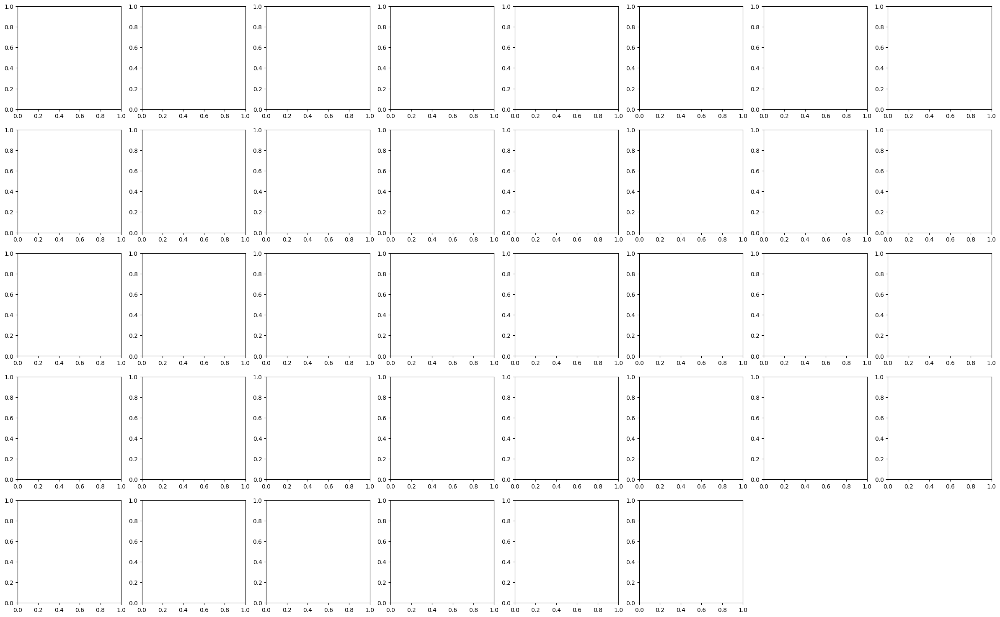

In [4]:
fig, ax = plt.subplots(8, 8, figsize=(30, 30))
col = 0
row = 0
for var in binary_vars_harvard:
    if col == 8:
        col = 0
        row += 1
    # create a 4 bar plot where exacerbation is orange and non-exacerbation blue
    exa_and_0 = harvard[(harvard['Exacerbation'] == 1) & (harvard[var] == 0)].shape[0]
    exa_and_1 = harvard[(harvard['Exacerbation'] == 1) & (harvard[var] == 1)].shape[0]
    non_exa_and_0 = harvard[(harvard['Exacerbation'] == 0) & (harvard[var] == 0)].shape[0]
    non_exa_and_1 = harvard[(harvard['Exacerbation'] == 0) & (harvard[var] == 1)].shape[0]
    
    ax[row, col].bar([0, 1], [non_exa_and_0, non_exa_and_1], color='#1f77b4', label='No exacerbation')
    # leave a gap between the bars and then the next set of bars
    ax[row, col].bar([0.2, 1.2], [exa_and_0, exa_and_1], color='#ff7f0e', label='Exacerbation')
    ax[row, col].set_title(var)
    ax[row, col].set_xticklabels(["", 'No', "", "Yes"], rotation=0)
    # add a label onto the middle of the bars

    # if the bar is larger than 10% of the plot height, write the number inside the bar
    # get the max of the 4 bars
    chart_height = np.max([non_exa_and_0, non_exa_and_1, exa_and_0, exa_and_1])

    if non_exa_and_0 > 0.1 * chart_height:
        ax[row, col].text(0.1, non_exa_and_0/2, non_exa_and_0, color='white', fontweight='bold', ha='center', va='center')
    else:
        ax[row, col].text(0.1, non_exa_and_0/2, non_exa_and_0, color='black', fontweight='bold', ha='center', va='center')
    if non_exa_and_1 > 0.1 * chart_height:
        ax[row, col].text(1.1, non_exa_and_1/2, non_exa_and_1, color='white', fontweight='bold', ha='center', va='center')
    else:
        ax[row, col].text(1.1, non_exa_and_1/2, non_exa_and_1, color='black', fontweight='bold', ha='center', va='center')
    if exa_and_0 > 0.1 * chart_height:
        ax[row, col].text(0.3, exa_and_0/2, exa_and_0, color='white', fontweight='bold', ha='center', va='center')
    else:
        ax[row, col].text(0.3, exa_and_0/2, exa_and_0, color='black', fontweight='bold', ha='center', va='center')
    if exa_and_1 > 0.1 * chart_height:
        ax[row, col].text(1.3, exa_and_1/2, exa_and_1, color='white', fontweight='bold', ha='center', va='center')
    else:
        ax[row, col].text(1.3, exa_and_1/2, exa_and_1, color='black', fontweight='bold', ha='center', va='center')
    ax[row, col].legend()
    col += 1

plt.tight_layout()
# save svg
plt.savefig('./results/binary_vars_harvard.svg', format='svg', dpi=1200)

## Matthews Correlation

                         Variable       MCC   P-value
28                  ICU last year  0.181815  0.048511
29             Increase in sputum  0.168214  0.053449
9                      Budesonide  0.164249  0.106581
38                 Night Symptoms  0.160183  0.062768
8                Breathing faster  0.148324  0.087808
37          Myocardial infarction  0.136437  0.137039
35                      Migraines  0.134154  0.149827
50                      Singulair  0.131681  0.161560
46           Pill to control Exa.  0.131486  0.133993
18        Enrolled as Exacerbator  0.129522  0.155594
58                        Xopenex  0.115338  0.277793
11                     Chest pain  0.114636  0.214623
43                 Other symptoms  0.114636  0.214623
14        Coronary Artery Disease  0.110345  0.254055
56                    Worse cough  0.094840  0.331202
0               2+ Exa. last year  0.082131  0.342604
13       Congestive Heart Failure  0.081770  0.342615
26         Hospitalized last

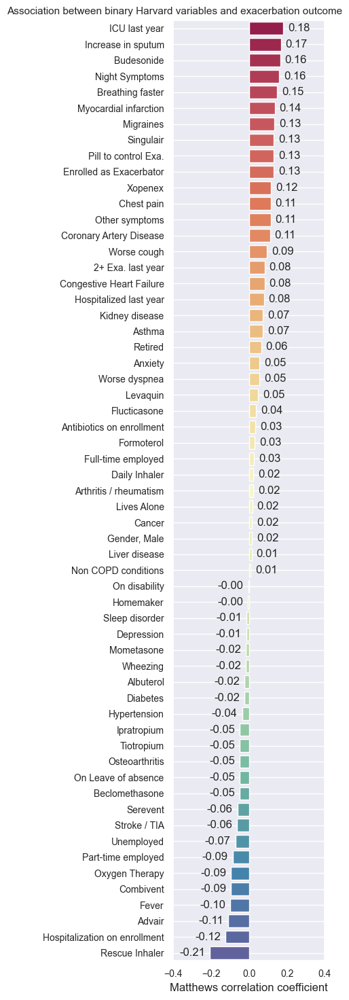

In [198]:
# calculate matthews correlation coefficient for binary variables
from sklearn.metrics import matthews_corrcoef
from scipy.stats import fisher_exact
mcc = []
p_values = []
harvard_binary = harvard.copy()
harvard_binary = harvard_binary.fillna(harvard_binary.mode().iloc[0])

for var in sorted(binary_vars_harvard):
    mcc.append(matthews_corrcoef(harvard_binary[var], harvard_binary['Exacerbation']))
    # calculate p-value for 2x2 contingency table
    table = pd.crosstab(harvard_binary[var], harvard_binary['Exacerbation'])
    p_values.append(fisher_exact(table)[1])

sns.set_theme()

# create a dataframe
mcc_df = pd.DataFrame({'Variable': binary_vars_harvard, 'MCC': mcc, 'P-value': p_values})
# sort
mcc_df = mcc_df.reindex(mcc_df['MCC'].sort_values(ascending=False).index)
print(mcc_df)
fig, ax = plt.subplots(figsize=(5, 15))
# use sns to create a horizontal bar plot, color is MCC values
ax = sns.barplot(x=mcc_df['MCC'], y=mcc_df['Variable'], orient='h', palette="Spectral")
ax.grid(False, axis='x')
ax.grid(True, axis='y')
# show bar values for all bar with a dash between 
ax.bar_label(ax.containers[0], fmt='%.2f', label_type='edge', padding=5)
ax.set_xlim(-0.4, 0.4)
# add current ax to gridspec

fig.suptitle('Association between binary Harvard variables and exacerbation outcome', fontsize=11)
plt.tight_layout()
plt.xlabel('Matthews correlation coefficient')
plt.ylabel('')
# increase font size
plt.tick_params(axis='both', which='major', labelsize=10)

plt.rcParams['svg.fonttype'] = 'none'
# save as svg to results folder
plt.savefig('./results/mcc_binary.svg', format='svg')

## Plot categorical vars

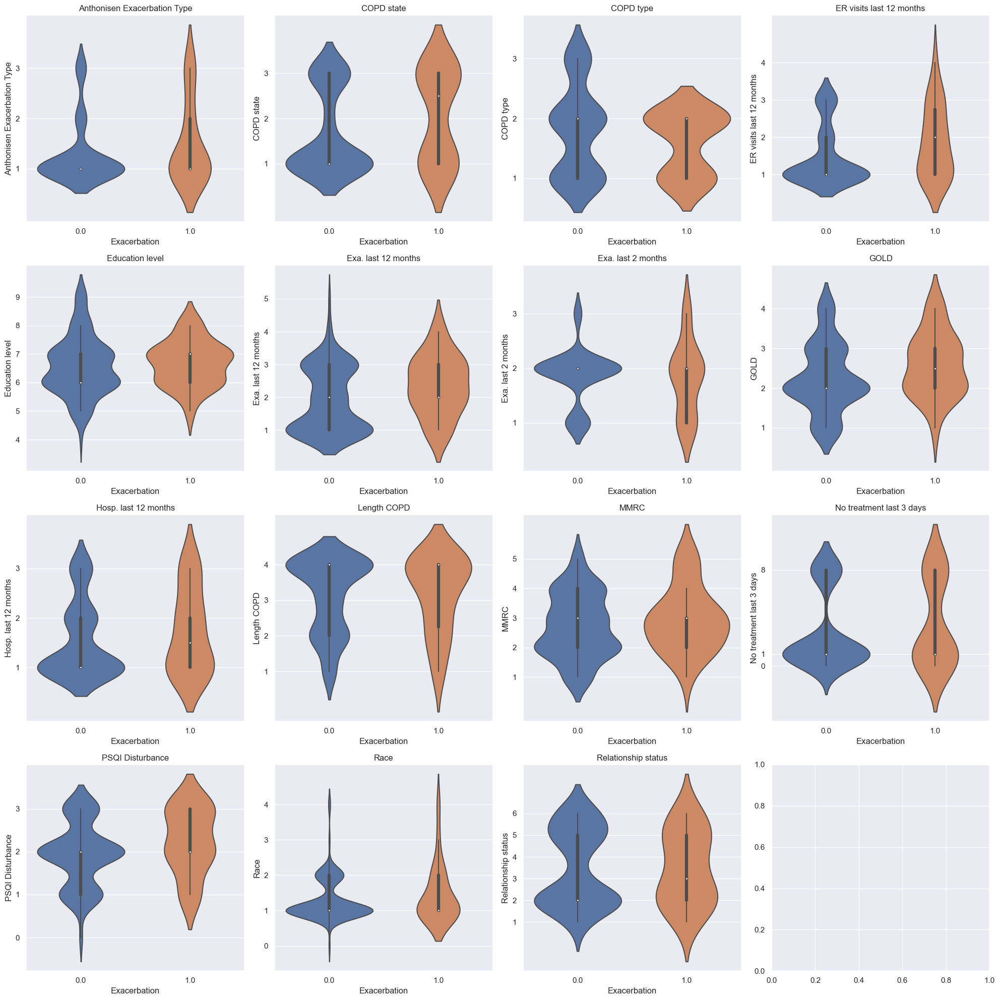

In [61]:
# plot all categorical vars vs target
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
col = 0
row = 0
harvard_viz = harvard.copy()
# drop all rows with nan values
harvard_viz[categorical_vars_harvard] = harvard_viz[categorical_vars_harvard].fillna(harvard_viz[categorical_vars_harvard].mode().iloc[0])
for var in categorical_vars_harvard:
    # do not consider nan values 
    if col == 4:
        col = 0
        row += 1
    # plot a line between mean value for exacerbation and non-exacerbation
    sns.violinplot(x='Exacerbation', y=var, data=harvard_viz, ax=axs[row, col])
    axs[row, col].set_title(var)
    axs[row, col].set_yticks(harvard_viz[var].unique())
    axs[row, col].set_ylabel(var)
    axs[row, col].set_xlabel('Exacerbation')
    col += 1

plt.tight_layout()

## Cramer's V

                        Variable  Cramers_V   p_value
3       ER visits last 12 months   0.220512  0.017971
5            Exa. last 12 months   0.190625  0.053305
11      No treatment last 3 days   0.163699  0.097966
2                      COPD type   0.150633  0.071321
10                          MMRC   0.147773  0.124933
12              PSQI Disturbance   0.098567  0.227609
1                     COPD state   0.091429  0.198483
7                           GOLD   0.062969  0.321148
14           Relationship status   0.028066  0.398005
0   Anthonisen Exacerbation Type   0.000000  0.881805
4                Education level   0.000000  0.648065
6             Exa. last 2 months   0.000000  0.872605
8           Hosp. last 12 months   0.000000  0.624564
9                    Length COPD   0.000000  0.920525
13                          Race   0.000000  0.563154


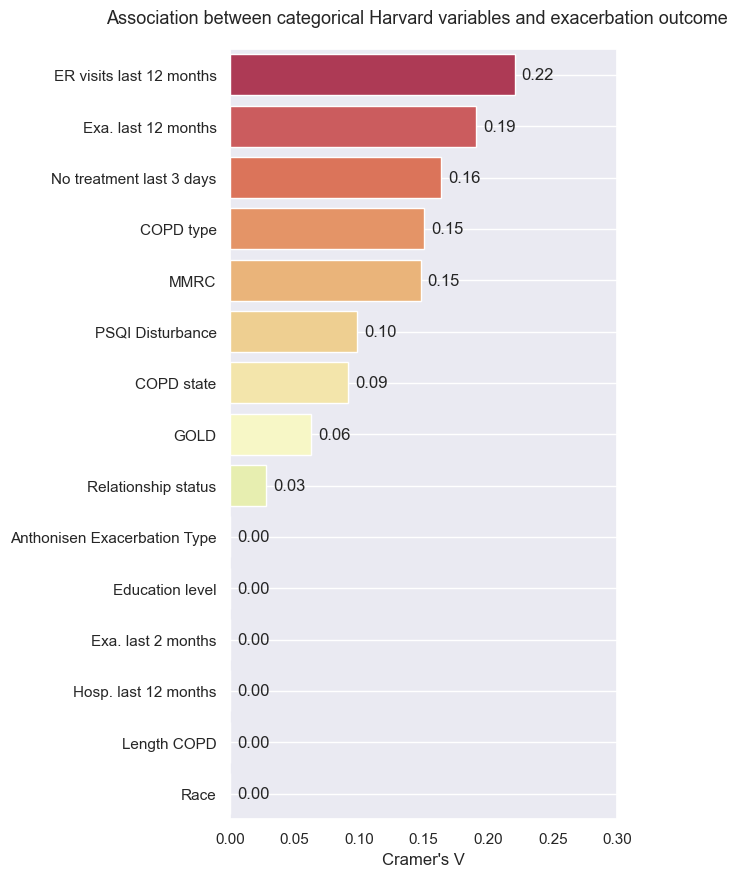

In [199]:
# calculate Cramer's V for all categorical variables
from scipy.stats import chi2_contingency

# calculate Cramer's V between the target (Exacerbation) and all categorical variables
# relied upon https://stackoverflow.com/questions/20892799/using-pandas-calculate-cram%C3%A9rs-coefficient-matrix
cramers_v = []
p_values = []
harvard_categorical = harvard[categorical_vars_harvard].copy()
# print unique values for 'Exa. last 12 months'
for var in categorical_vars_harvard:
    # calculate contingency table
    contingency_table = pd.crosstab(harvard_categorical[var], harvard['Exacerbation']).to_numpy()
    X2 = chi2_contingency(contingency_table, correction=False)[0]
    p_value = chi2_contingency(contingency_table, correction=False)[1]
    n = contingency_table.sum().sum()
    phi2 = X2/n
    r,k = contingency_table.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    cramers_v.append(np.sqrt(phi2corr / min((kcorr-1), (rcorr-1))))
    p_values.append(p_value)
# sort by absolute value of cramers_v
cramers_v = pd.DataFrame({'Variable': categorical_vars_harvard, 'Cramers_V': cramers_v, 'p_value': p_values})
cramers_v = cramers_v.reindex(cramers_v['Cramers_V'].abs().sort_values(ascending=False).index)
print(cramers_v)
sns.set_style()
# plot Cramer's V for all categorical variables
fig, ax = plt.subplots(figsize=(5, 10))
ax = sns.barplot(x=cramers_v['Cramers_V'], y=cramers_v['Variable'], orient='h', palette="Spectral")
ax.grid(False, axis='x')
ax.grid(True, axis='y')
# add values to the bars
ax.bar_label(ax.containers[0], fmt='%.2f', label_type='edge', padding=5)
# set x axis limits
ax.set_xlim(0, 0.3)
fig.suptitle("Association between categorical Harvard variables and exacerbation outcome", fontsize=13, y=0.92)
# center the title
ax.title.set_position([0.3, 1.05])
plt.xlabel("Cramer's V")
plt.ylabel("")

plt.rcParams['svg.fonttype'] = 'none'
# save as svg to results folder
plt.savefig('./results/cramers_v.svg', format='svg')

## Plot continuous vars

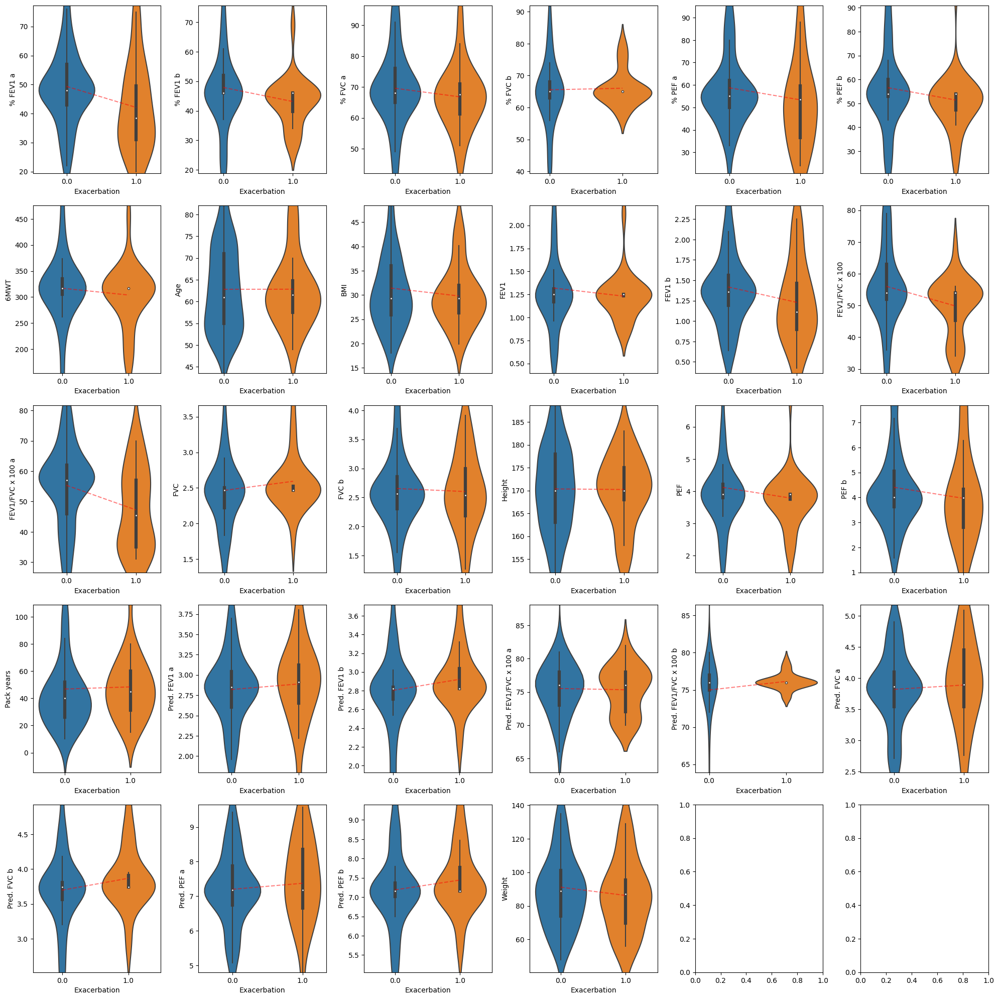

In [45]:
import seaborn as sns
# plot all continuous vars vs target
fig, axs = plt.subplots(5, 6, figsize=(20, 20))
col = 0
row = 0
harvard_viz = harvard.copy()
harvard_viz[continuous_vars] = harvard_viz[continuous_vars].fillna(harvard_viz[continuous_vars].median())
for var in continuous_vars:
    if col == 6:
        col = 0
        row += 1
    # plot a violin plot for exacerbation at x=1 and one for no exacerbation at x=0
    sns.violinplot(x='Exacerbation', y=var, data=harvard_viz, ax=axs[row, col])
    # move the y axis so that the mean value of the non-exacerbators is in the center
    axs[row, col].set_ylim(harvard_viz[var].mean() - 2 * harvard_viz[var].std(), harvard_viz[var].mean() + 2 * harvard_viz[var].std())
    # draw a line between the median values at 1 and the median values at 0
    axs[row, col].plot([0, 1], [harvard_viz[harvard_viz['Exacerbation'] == 0][var].mean(), harvard_viz[harvard_viz['Exacerbation'] == 1][var].mean()], color='red', alpha=0.5, linestyle='--')
    axs[row, col].set_xlabel('Exacerbation')
    axs[row, col].set_xticks([0, 1])
    axs[row, col].set_ylabel(var)
    col += 1

plt.tight_layout()
# save as svg to results folder
plt.savefig('./results/point_biserial_vis.svg', format='svg')

## Point Biserial Correlation

                  Variable  Point biserial correlation   p_value
24             Pred. FVC b                    0.101685  0.220379
20            Pred. FEV1 b                    0.094101  0.256926
26             Pred. PEF b                    0.083920  0.312222
13                     FVC                    0.077152  0.352983
22  Pred. FEV1/FVC x 100 b                    0.073155  0.378555
25             Pred. PEF a                    0.051653  0.534382
19            Pred. FEV1 a                    0.047799  0.565347
23             Pred. FVC a                    0.036957  0.656753
18              Pack years                    0.018207  0.826738
3                  % FVC b                    0.013680  0.869375
7                      Age                    0.000676  0.993516
15                  Height                   -0.005492  0.947367
21  Pred. FEV1/FVC x 100 a                   -0.010689  0.897761
14                   FVC b                   -0.025504  0.759130
6                     6MW

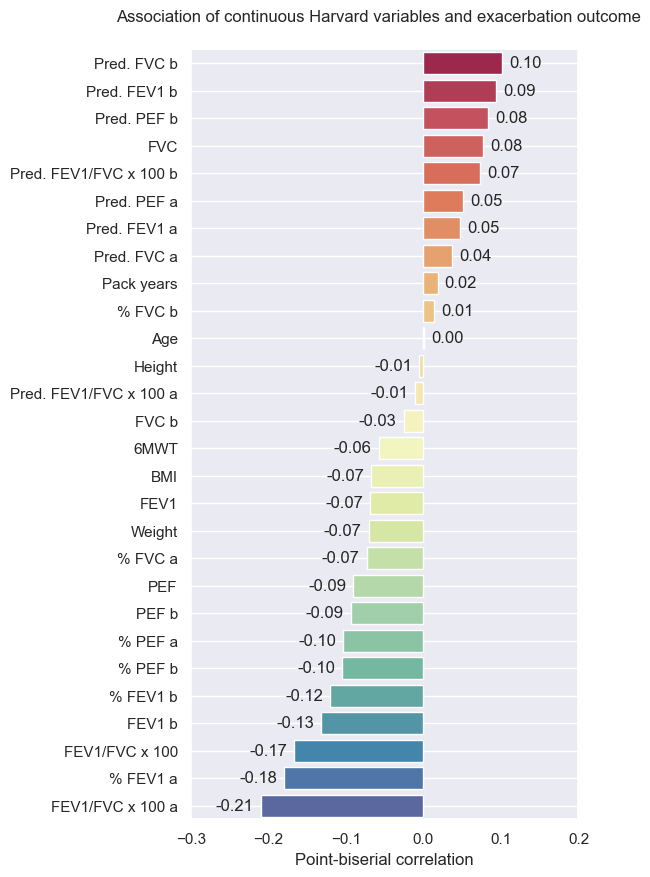

In [200]:
from scipy.stats import pointbiserialr
# calculate point biserial correlation for continuous variables
biserial_corr = []
p_values = []
harvard_continuous = harvard[continuous_vars].copy()
for var in continuous_vars:
    # drop all rows with nan values
    harvard_continuous[var] = harvard_continuous[var].fillna(harvard_continuous[var].median())
    # calculate point biserial correlation
    biserial_corr.append(pointbiserialr(harvard_continuous[var], harvard['Exacerbation'])[0])
    # calculate p-value
    p_values.append(pointbiserialr(harvard_continuous[var], harvard['Exacerbation'])[1])

# create a dataframe
biserial_corr = pd.DataFrame({'Variable': continuous_vars, 'Point biserial correlation': biserial_corr, 'p_value': p_values})
# sort by absolute value of point biserial correlation
biserial_corr = biserial_corr.reindex(biserial_corr['Point biserial correlation'].sort_values(ascending=False).index)
print(biserial_corr)

sns.set_style()
# plot point biserial correlation for all continuous variables
fig, ax = plt.subplots(figsize=(5, 10))
ax = sns.barplot(x=biserial_corr['Point biserial correlation'], y=biserial_corr['Variable'], orient='h', palette="Spectral")
ax.grid(False, axis='x')
ax.grid(True, axis='y')
# add values to the bars
ax.bar_label(ax.containers[0], fmt='%.2f', label_type='edge', padding=5)
# set x axis limits
ax.set_xlim(-0.3, 0.2)
    

# ax.title('Correlation of continuous Harvard variables with exacerbation outcome',  pad=10, fontsize=15)
fig.suptitle('Association of continuous Harvard variables and exacerbation outcome', fontsize=12, y=0.92)
# remove y label
ax.set_ylabel('')

plt.rcParams['svg.fonttype'] = 'none'
plt.xlabel('Point-biserial correlation')
# set y ticks to fontweight bold
# ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')
# save as svg to results folder
plt.savefig('./results/point_biserial.svg', format='svg')

## Deal with correlated variables

In [4]:
# plot correlation matrix of all continuous variables
# calculate correlation matrix
corr_matrix = harvard[continuous_vars_harvard].corr()
# increase DPI of figure
fig, ax = plt.subplots(figsize=(30, 30), dpi=300)
# use seaborn to plot the correlation matrix, increase font size, round to 2 decimals
ax = sns.heatmap(corr_matrix, annot=True, cmap='Spectral', annot_kws={'fontsize': 14 }, fmt='.2f')
# increase font size
plt.tick_params(axis='both', which='major', labelsize=14)
# increase font size of the color bar ticks
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=14)


In [11]:
# remove redundant variables
continuous_vars_harvard_filtered = continuous_vars_harvard.copy()

# drop all variables containing Pred. 
continuous_vars_harvard_filtered = continuous_vars_harvard_filtered[~continuous_vars_harvard_filtered.str.contains('Pred.')]

# only keep % FVC a
continuous_vars_harvard_filtered = continuous_vars_harvard_filtered.drop(['% FVC b', 'FVC', 'FVC b'])

# only keep % FEV1 a
continuous_vars_harvard_filtered = continuous_vars_harvard_filtered.drop(['% FEV1 b', 'FEV1', 'FEV1 b'])

# only keep FEV1 / FVC x 100 a
continuous_vars_harvard_filtered = continuous_vars_harvard_filtered.drop(['FEV1/FVC x 100'])

# only keep % PEF b
continuous_vars_harvard_filtered = continuous_vars_harvard_filtered.drop(['% PEF a', 'PEF b', 'PEF'])

# drop Weight (correlated with BMI)
continuous_vars_harvard_filtered = continuous_vars_harvard_filtered.drop('Weight')

print(continuous_vars_harvard_filtered)



# drop weight
# out of all variables containing FEV1 o

Index(['% FEV1 a', '% FVC a', '% PEF b', '6MWT', 'Age', 'BMI',
       'FEV1/FVC x 100 a', 'Height', 'Pack years'],
      dtype='object')


## Feature Space

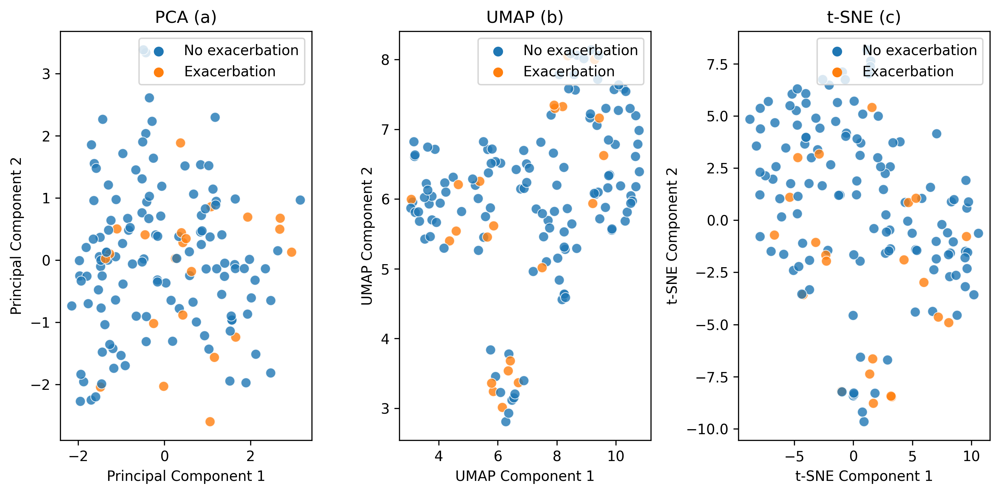

In [5]:
# create a PCA and UMAP plot for a selection of features
candidate_features = ["FEV1/FVC x 100 a", "6MWT", "Height", "Exa. last 12 months", "Rescue Inhaler", "ER visits last 12 months", "MMRC", "Exacerbation"]

selected_harvard = harvard[candidate_features].copy()
# fill using median
selected_harvard = selected_harvard.fillna(selected_harvard.median())
X_harvard = selected_harvard.drop(columns=['Exacerbation'])
y_harvard = selected_harvard['Exacerbation']

# standardize
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
selected_harvard = scaler.fit_transform(X_harvard)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), dpi=300)
# create a PCA plot
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(selected_harvard)
# scatter plot. Legend should say exacerbation and non-exacerbation
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=y_harvard, ax=ax[0], legend='full', alpha=0.8, s=50 )
# change legend labels
handles, labels = ax[0].get_legend_handles_labels()
ax[0].legend(handles=handles, labels=['No exacerbation', 'Exacerbation'], loc='upper right')
ax[0].set_title('PCA (a)')
ax[0].set_xlabel('Principal Component 1')
ax[0].set_ylabel('Principal Component 2')
# add exacerbation and non-exacerbation as legend
# create a UMAP plot
import umap
reducer = umap.UMAP()
umap_result = reducer.fit_transform(selected_harvard)
sns.scatterplot(x=umap_result[:, 0], y=umap_result[:, 1], hue=y_harvard, ax=ax[1], legend='full', alpha=0.8, s=50)
# change legend labels
handles, labels = ax[1].get_legend_handles_labels()
ax[1].legend(handles=handles, labels=['No exacerbation', 'Exacerbation'], loc='upper right')
ax[1].set_title('UMAP (b)')
ax[1].set_xlabel('UMAP Component 1')
ax[1].set_ylabel('UMAP Component 2')

# create a t-SNE plot
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)
tsne_result = tsne.fit_transform(selected_harvard)
sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=y_harvard, ax=ax[2], legend='full', alpha=0.8, s=50)
# change legend labels
handles, labels = ax[2].get_legend_handles_labels()
ax[2].legend(handles=handles, labels=['No exacerbation', 'Exacerbation'], loc='upper right')
ax[2].set_title('t-SNE (c)')
ax[2].set_xlabel('t-SNE Component 1')
ax[2].set_ylabel('t-SNE Component 2')
plt.tight_layout()



# Descriptive Statistics Harvard

In [201]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from scipy.stats import norm
import statsmodels.api as sm

# binary columns are variables with only 2 values
binary_cols = harvard.columns[harvard.nunique() == 2].drop('Exacerbation')
count_dataframe = pd.DataFrame(columns=['Exacerbation', 'No Exacerbation', 'Odds Ratio'])
# add row n with the count of exacerbations
exa_count = harvard['Exacerbation'][harvard['Exacerbation'] == 1].count()
no_exa_count = harvard['Exacerbation'][harvard['Exacerbation'] == 0].count()
count_dataframe.loc['n'] = exa_count, no_exa_count, ""
for var in binary_cols:
    # the Exacerbation column is all values where fclinra08 is 1 and the value in col is the positive value
    exa_col_count = [harvard['Exacerbation'][harvard['Exacerbation'] == 1][harvard[var] == 1].count()]
    exa_percentage = round(exa_col_count[0] / exa_count * 100, 2)
    exa_col_string = str(exa_col_count[0]) + ' (' + str(exa_percentage) + '%)'
    no_exa_col_count = [harvard['Exacerbation'][harvard['Exacerbation'] == 0][harvard[var] == 1].count()]
    no_exa_percentage = round(no_exa_col_count[0] / no_exa_count * 100, 2)
    no_exa_col_string = str(no_exa_col_count[0]) + ' (' + str(no_exa_percentage) + '%)'
    # fit a logistic model to calculate the odds ratio
    X = harvard[var]
    # drop all rows with nan values
    X = X[~np.isnan(X)]
    y = harvard['Exacerbation']
    y = y[X.index]
    X = X.values.reshape(-1, 1)
    y = LabelEncoder().fit_transform(y)
    # calculate odds ratio for this variable using stats model
    sm_model = sm.Logit(y, sm.add_constant(X)).fit(disp=False)
    # get 95% CI for odds ratio
    ci = sm_model.conf_int(alpha=0.05, cols=None)
    # calculate odds ratio
    odds_ratio = np.exp(sm_model.params[1])
    # calculate lower and upper bound of 95% CI
    lower_bound = np.exp(ci[0][1])
    upper_bound = np.exp(ci[1][1])
    # create a string for the odds ratio and 95% CI
    odds_ratio_string = str(round(odds_ratio, 2)) + ' (' + str(round(lower_bound, 2)) + '-' + str(round(upper_bound, 2)) + ')'
    # add the counts to the dataframe
    count_dataframe.loc[var] = exa_col_string, no_exa_col_string, odds_ratio_string

# sort by effect size
count_dataframe.sort_values(by='Odds Ratio', ascending=False, inplace=True)

# now look at numeric variables
numeric_cols = harvard.columns[harvard.nunique() > 2]
mean_dataframe = pd.DataFrame(columns=['Exacerbation', 'No Exacerbation', 'Odds Ratio'])
for var in numeric_cols:
    positives = harvard[var][harvard['Exacerbation'] == 1]
    negatives = harvard[var][harvard['Exacerbation'] == 0]
    # get the mean + std for the exacerbation group with only 2 decimal places
    exacerbation_mean = round([positives.mean()][0], 2)
    exacerbation_std = round([positives.std()][0], 2)
    # create a string for the mean +- std
    exacerbation_string = str(exacerbation_mean) + u"(" + str(exacerbation_std) +")"
    # get the mean + std for the no exacerbation group
    no_exacerbation_mean = round([negatives.mean()][0], 2)
    no_exacerbation_std = round([negatives.std()][0], 2)
    # create a string for the mean +- std
    no_exacerbation_string = str(no_exacerbation_mean) + u"(" + str(no_exacerbation_std) +")"
    std_exa = harvard[var][harvard['Exacerbation'] == 1].std()
    # effect size 1 (Glass's delta) with Exacerbation group variance that we want to emphasize
    #effect_size = np.round((exacerbation_mean - no_exacerbation_mean) / std_exa, 2)
    X = harvard[var]
    # drop all rows with nan values
    X = X[~np.isnan(X)]
    y = harvard['Exacerbation']
    # match the indices of X and y
    y = y[X.index]
    X = X.values.reshape(-1, 1)
    y = LabelEncoder().fit_transform(y)
     # calculate odds ratio for this variable using stats model
    sm_model = sm.Logit(y, sm.add_constant(X)).fit(disp=False)
    ci = sm_model.conf_int(alpha=0.05, cols=None)
    # calculate odds ratio
    odds_ratio = np.exp(sm_model.params[1])
    # calculate lower and upper bound of 95% CI
    lower_bound = np.exp(ci[0][1])
    upper_bound = np.exp(ci[1][1])
    # create a string for the odds ratio and 95% CI
    odds_ratio_string = str(round(odds_ratio, 2)) + ' (' + str(round(lower_bound, 2)) + '-' + str(round(upper_bound, 2)) + ')'

    # add the strings to the dataframe
    mean_dataframe.loc[var] = exacerbation_string, no_exacerbation_string, odds_ratio_string

# sort by effect size
mean_dataframe.sort_values(by='Odds Ratio', ascending=False, inplace=True)

# concat both dataframes
descriptive_stats = pd.concat([count_dataframe, mean_dataframe], axis=0)


# export to csv
descriptive_stats.to_csv('.\harvard_descriptive_stats_2.csv', sep=';', decimal=',', encoding='utf-8')

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Daniel\AppData\Local\Temp\ipykernel_24212\962331455.py:36: RuntimeWarning: overflow encountered in exp
  lower_bound = np.exp(ci[0][1])
C:\Users\Daniel\AppData\Local\Temp\ipykernel_24212\962331455.py:37: RuntimeWarning: overflow encountered in exp
  upper_bound = np.exp(ci[1][1])
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Daniel\AppData\Local\Temp\ipykernel_24212\962331455.py:37: RuntimeWarning: overflow encountered in exp
  upper_bound = np.exp(ci[1][1])
c:\Users\Daniel\AppData\Local\Programs\Python\Python3

# Triage

In [6]:
binary_vars_triage = triage.columns[triage.nunique() == 2].drop('Exacerbation')
categorical_vars_harvard_triage = triage.columns[(triage.nunique() > 2) & (triage.nunique() <= 5)]
continuous_vars_triage = triage.columns[triage.nunique() > 5]

# bonferroni corrected significance level
alpha = 0.05 / len(triage.columns)
print(alpha)

0.0010416666666666667


## Plot Binary vars

C:\Users\Daniel\AppData\Local\Temp\ipykernel_33520\1354438671.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[row, col].set_xticklabels(["", 'No', "", "Yes"], rotation=0)


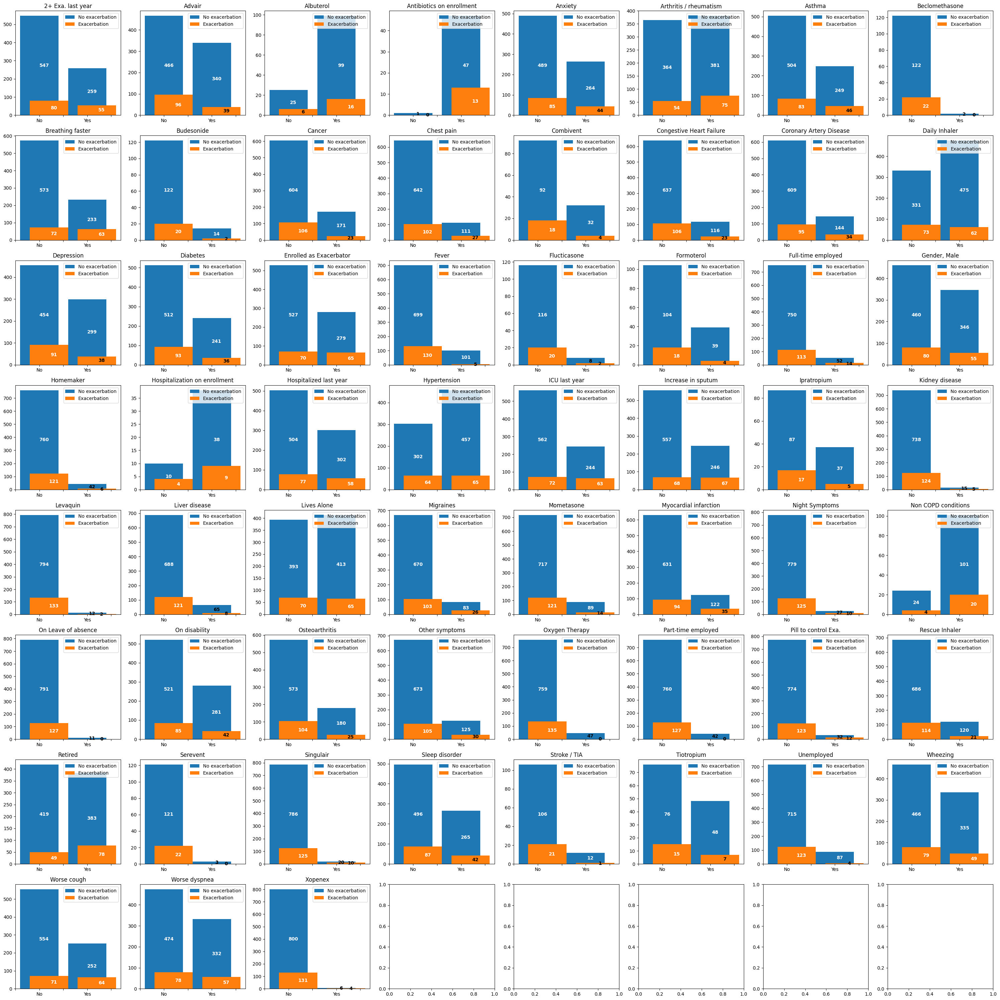

In [12]:
fig, ax = plt.subplots(8, 8, figsize=(30, 30))
col = 0
row = 0
for var in binary_vars_triage:
    if col == 8:
        col = 0
        row += 1
    # create a 4 bar plot where exacerbation is orange and non-exacerbation blue
    exa_and_0 = harvard[(harvard['Exacerbation'] == 1) & (harvard[var] == 0)].shape[0]
    exa_and_1 = harvard[(harvard['Exacerbation'] == 1) & (harvard[var] == 1)].shape[0]
    non_exa_and_0 = harvard[(harvard['Exacerbation'] == 0) & (harvard[var] == 0)].shape[0]
    non_exa_and_1 = harvard[(harvard['Exacerbation'] == 0) & (harvard[var] == 1)].shape[0]
    
    ax[row, col].bar([0, 1], [non_exa_and_0, non_exa_and_1], color='#1f77b4', label='No exacerbation')
    # leave a gap between the bars and then the next set of bars
    ax[row, col].bar([0.2, 1.2], [exa_and_0, exa_and_1], color='#ff7f0e', label='Exacerbation')
    ax[row, col].set_title(var)
    ax[row, col].set_xticklabels(["", 'No', "", "Yes"], rotation=0)
    # add a label onto the middle of the bars

    # if the bar is larger than 10% of the plot height, write the number inside the bar
    # get the max of the 4 bars
    chart_height = np.max([non_exa_and_0, non_exa_and_1, exa_and_0, exa_and_1])

    if non_exa_and_0 > 0.1 * chart_height:
        ax[row, col].text(0.1, non_exa_and_0/2, non_exa_and_0, color='white', fontweight='bold', ha='center', va='center')
    else:
        ax[row, col].text(0.1, non_exa_and_0/2, non_exa_and_0, color='black', fontweight='bold', ha='center', va='center')
    if non_exa_and_1 > 0.1 * chart_height:
        ax[row, col].text(1.1, non_exa_and_1/2, non_exa_and_1, color='white', fontweight='bold', ha='center', va='center')
    else:
        ax[row, col].text(1.1, non_exa_and_1/2, non_exa_and_1, color='black', fontweight='bold', ha='center', va='center')
    if exa_and_0 > 0.1 * chart_height:
        ax[row, col].text(0.3, exa_and_0/2, exa_and_0, color='white', fontweight='bold', ha='center', va='center')
    else:
        ax[row, col].text(0.3, exa_and_0/2, exa_and_0, color='black', fontweight='bold', ha='center', va='center')
    if exa_and_1 > 0.1 * chart_height:
        ax[row, col].text(1.3, exa_and_1/2, exa_and_1, color='white', fontweight='bold', ha='center', va='center')
    else:
        ax[row, col].text(1.3, exa_and_1/2, exa_and_1, color='black', fontweight='bold', ha='center', va='center')
    ax[row, col].legend()
    col += 1

plt.tight_layout()
# save svg
plt.savefig('./results/binary_vars_harvard.svg', format='svg', dpi=1200)

## Matthews Correlation Coefficient

                    Variable       MCC       P-value  Significant
18            Night Symptoms  0.064531  3.283242e-02        False
11    Hospitalized last year  0.053301  8.185057e-02        False
21    Pulmonary Hypertension  0.050212  9.718416e-02        False
0          2+ Exa. last year  0.044184  1.491088e-01        False
23                    Smoker  0.037860  2.185182e-01        False
12              Hypertension  0.024327  4.527693e-01        False
19            Oxygen Therapy  0.022270  4.845109e-01        False
7                   Diabetes  0.017560  6.096177e-01        False
9               Gender, Male  0.014159  6.353322e-01        False
1                Acid Reflux  0.004688  9.316564e-01        False
10     Help Daily Activities  0.001848  1.000000e+00        False
17               Lives Alone -0.002901  1.000000e+00        False
3                     Asthma -0.012652  7.197133e-01        False
13             ICU last year -0.014886  6.567160e-01        False
2         

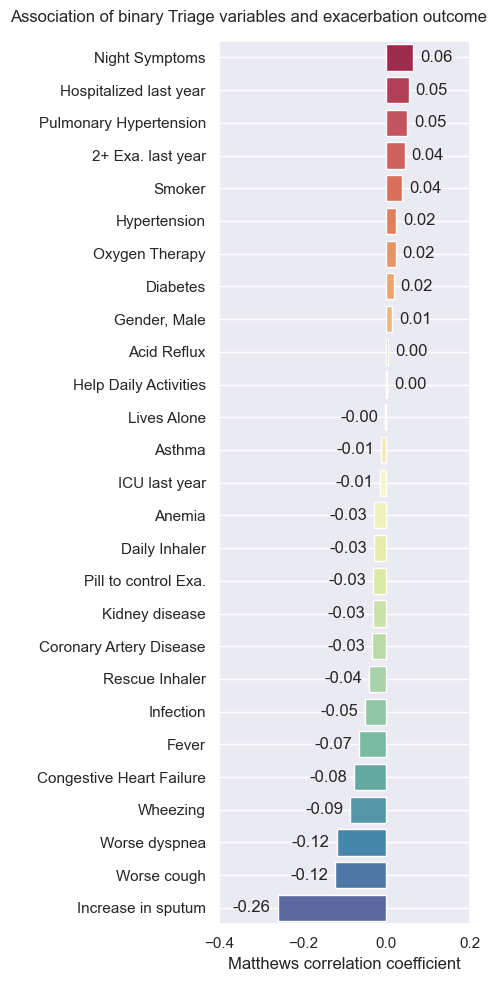

In [196]:
# calculate matthews correlation coefficient for binary variables
from sklearn.metrics import matthews_corrcoef
mcc = []
p_values = []
triage_binary = triage.copy()
triage_binary = triage_binary.fillna(triage_binary.mode().iloc[0])

for var in sorted(binary_vars_triage):
    mcc.append(matthews_corrcoef(triage_binary[var], triage_binary['Exacerbation']))
    # calculate p-value for 2x2 contingency table
    table = pd.crosstab(triage_binary[var], triage_binary['Exacerbation'])
    p_values.append(fisher_exact(table)[1])


# create a dataframe
mcc_df = pd.DataFrame({'Variable': binary_vars_triage, 'MCC': mcc, 'P-value': p_values, 'Significant': np.array(p_values) < alpha})
# sort by absolute value of mcc
mcc_df = mcc_df.reindex(mcc_df['MCC'].sort_values(ascending=False).index)
print(mcc_df)
# plot mcc
fig, ax = plt.subplots(figsize=(5, 10))
# use sns to create a horizontal bar plot with value as text, add a grid line at each values
ax = sns.barplot(x=mcc_df['MCC'], y=mcc_df['Variable'], orient='h', palette="Spectral")
ax.grid(False, axis='x')
ax.grid(True, axis='y')
# show bar values for all bar with a dash between
ax.bar_label(ax.containers[0], fmt='%.2f', label_type='edge', padding=5)
ax.set_xlim(-0.4, 0.2)
fig.suptitle('Association of binary Triage variables and exacerbation outcome', fontsize=12)

plt.tight_layout()
plt.xlabel('Matthews correlation coefficient')
plt.ylabel('')

# save as svg to results folder
plt.rcParams['svg.fonttype'] = 'none'
plt.savefig('./results/mcc_binary_triage.svg', format='svg')

## Plot categorical

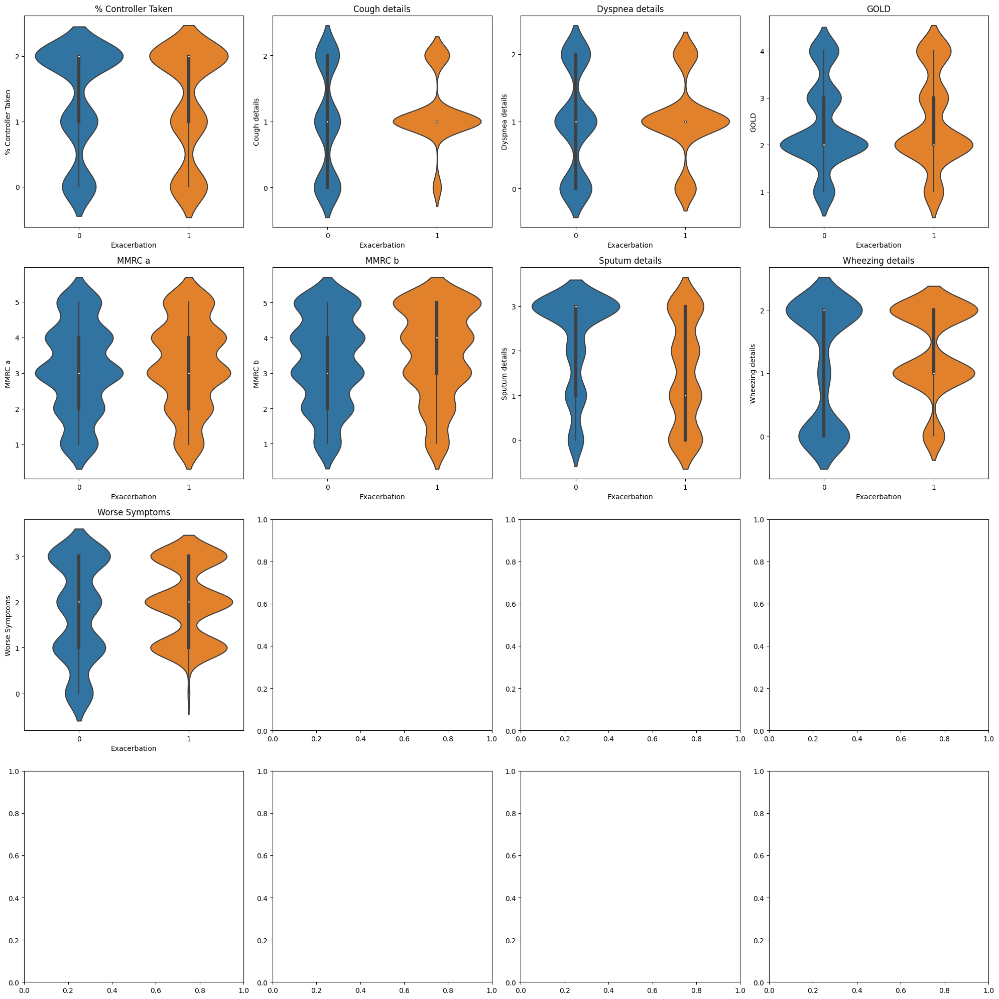

In [14]:
# plot all categorical vars vs target
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
col = 0
row = 0
triage_viz = triage.copy()
# drop all rows with nan values
triage_viz[categorical_vars_harvard_triage] = triage_viz[categorical_vars_harvard_triage].fillna(triage_viz[categorical_vars_harvard_triage].mode().iloc[0])
for var in categorical_vars_harvard_triage:
    # do not consider nan values 
    if col == 4:
        col = 0
        row += 1
    # plot a line between mean value for exacerbation and non-exacerbation
    sns.violinplot(x='Exacerbation', y=var, data=triage_viz, ax=axs[row, col])
    axs[row, col].set_title(var)
    axs[row, col].set_yticks(triage_viz[var].unique())
    axs[row, col].set_ylabel(var)
    axs[row, col].set_xlabel('Exacerbation')
    col += 1

plt.tight_layout()

## Cramer's V

             Variable  Cramers_V       p_value  Significant
7    Wheezing details   0.421347  6.458282e-45         True
1       Cough details   0.415998  8.202764e-44         True
6      Sputum details   0.336368  2.672890e-28         True
8      Worse Symptoms   0.270304  1.638479e-18         True
2     Dyspnea details   0.249948  1.471790e-16         True
5              MMRC b   0.085723  1.496839e-02        False
3                GOLD   0.013656  3.687467e-01        False
0  % Controller Taken   0.000000  4.183130e-01        False
4              MMRC a   0.000000  4.617639e-01        False


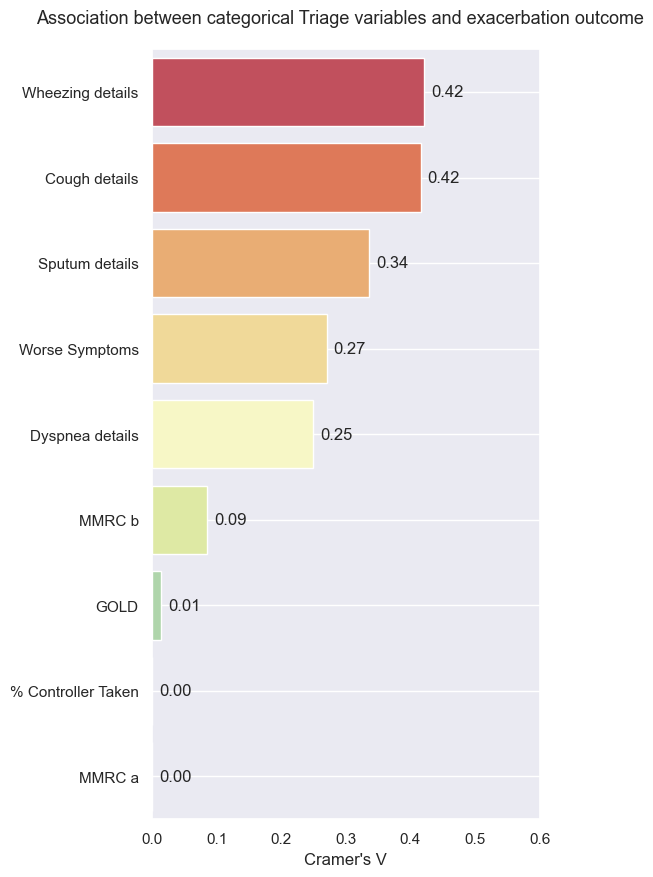

In [284]:
# calculate Cramer's V for all categorical variables
from scipy.stats import chi2_contingency

# calculate Cramer's V between the target (Exacerbation) and all categorical variables
cramers_v = []
p_values = []
triage_categorical = triage[categorical_vars_harvard_triage].copy()
for var in categorical_vars_harvard_triage:
    # calculate contingency table
    contingency_table = pd.crosstab(triage_categorical[var], triage['Exacerbation']).to_numpy()
    X2 = chi2_contingency(contingency_table, correction=False)[0]
    p_value = chi2_contingency(contingency_table, correction=False)[1]
    n = contingency_table.sum()
    phi2 = X2/n
    r,k = contingency_table.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    cramers_v.append(np.sqrt(phi2corr / min((kcorr-1), (rcorr-1))))
    p_values.append(p_value)
# sort by absolute value of cramers_v
cramers_v = pd.DataFrame({'Variable': categorical_vars_harvard_triage, 'Cramers_V': cramers_v, 'p_value': p_values, 'Significant': np.array(p_values) < alpha})
cramers_v = cramers_v.reindex(cramers_v['Cramers_V'].sort_values(ascending=False).index)
print(cramers_v)
# convert dataframe to float
cramers_v['Cramers_V'] = cramers_v['Cramers_V'].astype(float)

fig, ax = plt.subplots(figsize=(5, 10))
ax = sns.barplot(x=cramers_v['Cramers_V'], y=cramers_v['Variable'], orient='h', palette='Spectral')
ax.grid(False, axis='x')
ax.grid(True, axis='y')
# add values to the bars
ax.bar_label(ax.containers[0], fmt='%.2f', label_type='edge', padding=5)
# set x axis limits
ax.set_xlim(0, 0.6)
fig.suptitle('Association between categorical Triage variables and exacerbation outcome', fontsize=13, y=0.92)
# center the title
ax.title.set_position([0.3, 1.05])
plt.xlabel("Cramer's V")
plt.ylabel("")

plt.rcParams['svg.fonttype'] = 'none'
# save as svg to results folder
plt.savefig('./results/cramers_v_triage.svg', format='svg')

## Plot continuous

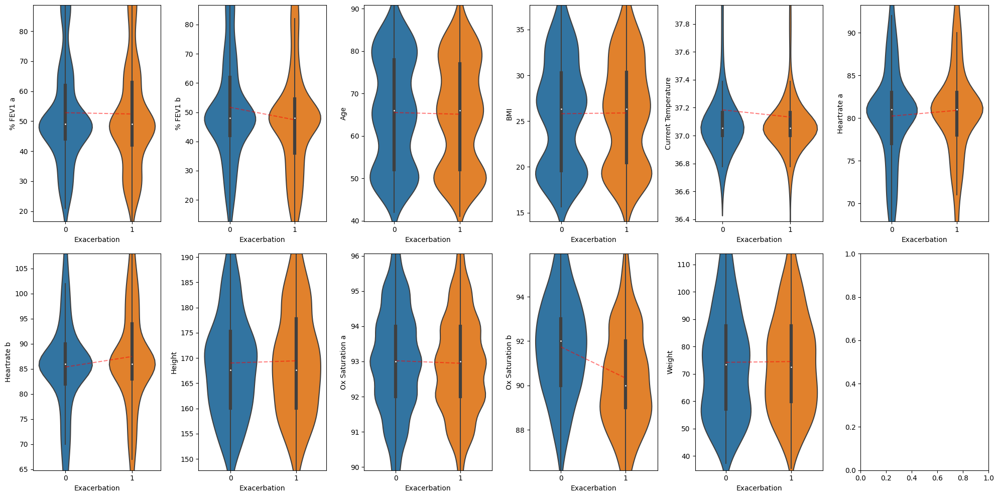

In [13]:
import seaborn as sns
# plot all continuous vars vs target
fig, axs = plt.subplots(2, 6, figsize=(20, 10))
col = 0
row = 0
triage_viz = triage.copy()
triage_viz[continuous_vars_triage] = triage_viz[continuous_vars_triage].fillna(triage_viz[continuous_vars_triage].median())
for var in continuous_vars_triage:
    if col == 6:
        col = 0
        row += 1
    # plot a violin plot for exacerbation at x=1 and one for no exacerbation at x=0
    sns.violinplot(x='Exacerbation', y=var, data=triage_viz, ax=axs[row, col])
    # move the y axis so that the mean value of the non-exacerbators is in the center
    axs[row, col].set_ylim(triage_viz[var].mean() - 2 * triage_viz[var].std(), triage_viz[var].mean() + 2 * triage_viz[var].std())
    # draw a line between the median values at 1 and the median values at 0
    axs[row, col].plot([0, 1], [triage_viz[triage_viz['Exacerbation'] == 0][var].mean(), triage_viz[triage_viz['Exacerbation'] == 1][var].mean()], color='red', alpha=0.5, linestyle='--')
    axs[row, col].set_xlabel('Exacerbation')
    axs[row, col].set_xticks([0, 1])
    axs[row, col].set_ylabel(var)
    col += 1

plt.tight_layout()
# save as svg to results folder
plt.savefig('./results/point_biserial_vis_triage.svg', format='svg')

## Point Biserial Correlation

               Variable  Point biserial correlation       p_value  Significant
6           Heartrate b                    0.096867  1.079392e-03        False
5           Heartrate a                    0.052633  7.618656e-02        False
7                Height                    0.020451  4.910682e-01        False
3                   BMI                    0.007043  8.125625e-01        False
10               Weight                    0.007008  8.134820e-01        False
0              % FEV1 a                   -0.011990  6.864437e-01        False
2                   Age                   -0.015791  5.949598e-01        False
8       Ox Saturation a                   -0.023246  4.337809e-01        False
4   Current Temperature                   -0.066180  2.571103e-02        False
1              % FEV1 b                   -0.115477  9.584981e-05         True
9       Ox Saturation b                   -0.287988  3.901978e-23         True


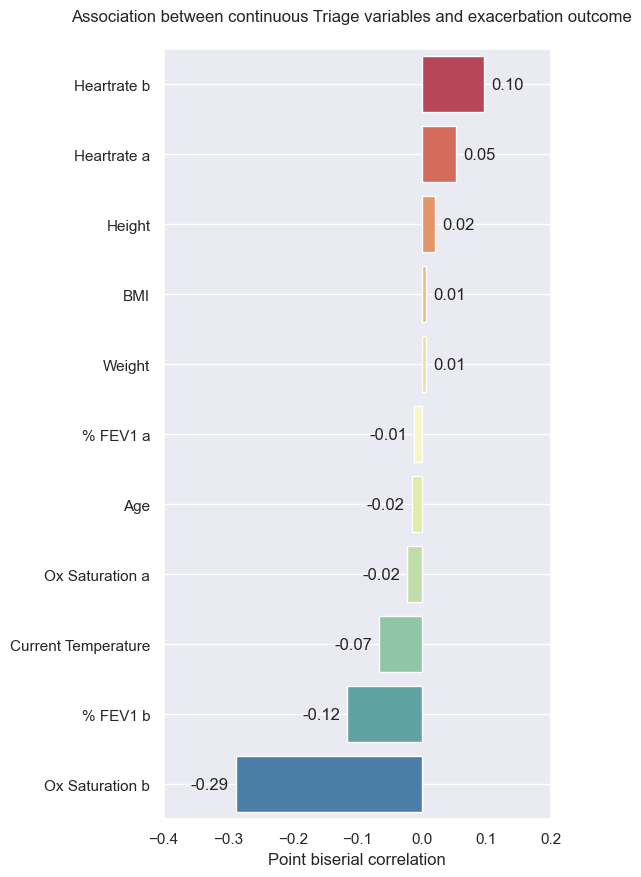

In [195]:
from scipy.stats import pointbiserialr
# calculate point biserial correlation for continuous variables
biserial_corr = []
p_values = []
triage_continuous = triage[continuous_vars_triage].copy()
for var in continuous_vars_triage:
    # drop all rows with nan values
    triage_continuous[var] = triage_continuous[var].fillna(triage_continuous[var].median())
    # calculate point biserial correlation
    biserial_corr.append(pointbiserialr(triage_continuous[var], triage['Exacerbation'])[0])
    # calculate p-value
    p_values.append(pointbiserialr(triage_continuous[var], triage['Exacerbation'])[1])

# create a dataframe
biserial_corr = pd.DataFrame({'Variable': continuous_vars_triage, 'Point biserial correlation': biserial_corr, 'p_value': p_values, 'Significant': np.array(p_values) < alpha})
biserial_corr = biserial_corr.reindex(biserial_corr['Point biserial correlation'].sort_values(ascending=False).index)
print(biserial_corr)

sns.set_style()
# plot point biserial correlation for all continuous variables
fig, ax = plt.subplots(figsize=(5, 10))
ax = sns.barplot(x=biserial_corr['Point biserial correlation'], y=biserial_corr['Variable'], orient='h', palette="Spectral")
ax.grid(False, axis='x')
ax.grid(True, axis='y')
# add values to the bars
ax.bar_label(ax.containers[0], fmt='%.2f', label_type='edge', padding=5)
# set x axis limits
ax.set_xlim(-0.4, 0.2)
fig.suptitle('Association between continuous Triage variables and exacerbation outcome', fontsize=12, y=0.92)
# remove y label
ax.set_ylabel('')
    
plt.xlabel('Point biserial correlation')
# save as svg to results folder
# make sure text is saved as svg
plt.rcParams['svg.fonttype'] = 'none'
plt.savefig('./results/point_biserial_triage.svg', format='svg')

## Correlated Features

In [27]:
# plot correlation matrix of all continuous variables
corr_matrix = triage[continuous_vars_triage].corr()
fig, ax = plt.subplots(figsize=(40, 40), dpi=300)
# use seaborn to plot the correlation matrix
ax = sns.heatmap(corr_matrix, annot=True, cmap='Spectral', annot_kws={'fontsize': 30})
# turn x-ticks vertical
plt.xticks(rotation=90)
plt.yticks(rotation=0)
# increase font size
plt.tick_params(axis='both', which='major', labelsize=30)
# increase font size of the color bar ticks
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=30)

In [12]:
# drop Weight and % FEV1 a
continuous_vars_triage_filtered = continuous_vars_triage.copy()
continuous_vars_triage_filtered = continuous_vars_triage_filtered.drop(['Weight', '% FEV1 a'])

# Feature Importance and Multivariate Analysis

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

target = 'Exacerbation'

# discrete_features_triage = triage.columns[triage.nunique() <= 5].drop(target)
# continuous_features_triage = triage.columns[triage.nunique() > 5]
# discrete_features_harvard = harvard.columns[harvard.nunique() <= 10].drop(target)
# continuous_features_harvard = continuous_vars_harvard_filtered


harvard_copy = harvard.copy()
harvard_copy.dropna(subset=[target], inplace=True)
# drop the difference between continuous_features_harvard and continuous_vars_harvard_filtered
harvard_copy.drop(continuous_vars_harvard.difference(continuous_vars_harvard_filtered), axis=1, inplace=True)
triage_copy = triage.copy()
triage_copy.dropna(subset=[target], inplace=True)
triage_copy.drop(continuous_vars_triage.difference(continuous_vars_triage_filtered), axis=1, inplace=True)

X_harvard = harvard_copy.drop(target, axis=1)
X_triage = triage_copy.drop(target, axis=1)
mutual_info_split_harvard = pd.DataFrame(columns=sorted(X_harvard.columns))
mutual_info_split_triage = pd.DataFrame(columns=sorted(X_triage.columns))
rf_split_harvard = pd.DataFrame(columns=sorted(X_harvard.columns))
rf_split_triage = pd.DataFrame(columns=sorted(X_triage.columns))
# use median to impute NaN values
X_harvard = X_harvard.fillna(X_harvard.median())
X_harvard = StandardScaler().fit_transform(X_harvard)
# transform back to dataframe
X_harvard = pd.DataFrame(X_harvard, columns=harvard_copy.drop(target, axis=1).columns)

X_triage = X_triage.fillna(X_triage.median())
X_triage = StandardScaler().fit_transform(X_triage)
X_triage = pd.DataFrame(X_triage, columns=triage_copy.drop(target, axis=1).columns)

y_harvard = harvard_copy[target]
y_harvard = LabelEncoder().fit_transform(y_harvard)
y_triage = triage_copy[target]
y_triage = LabelEncoder().fit_transform(y_triage)
for i in range(100):
    # create a train test split to shuffle the data
    X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=i)
    X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(X_triage, y_triage, test_size=0.2, random_state=i)
    # infomation gain processing
    # mutual_info_harvard_discrete = mutual_info_classif(X_train_harvard[discrete_features_harvard], y_train_harvard, random_state=42, discrete_features=True)
    # mutual_info_harvard_continuous = mutual_info_classif(X_train_harvard[continuous_features_harvard], y_train_harvard, random_state=42, discrete_features=False)
    # mutual_info_harvard = np.concatenate((mutual_info_harvard_discrete, mutual_info_harvard_continuous), axis=0)
    mutual_info_harvard = mutual_info_classif(X_train_harvard, y_train_harvard, random_state=42)
    # mutual_info_triage_discrete = mutual_info_classif(X_train_triage[discrete_features_triage], y_train_triage, random_state=42, discrete_features=True)
    # mutual_info_triage_continuous = mutual_info_classif(X_train_triage[continuous_features_triage], y_train_triage, random_state=42, discrete_features=False)
    # mutual_info_triage = np.concatenate((mutual_info_triage_discrete, mutual_info_triage_continuous), axis=0)
    mutual_info_triage = mutual_info_classif(X_train_triage, y_train_triage, random_state=42)
    mutual_info_harvard = pd.DataFrame({'variable': X_harvard.columns, 'importances': mutual_info_harvard})
    mutual_info_triage = pd.DataFrame({'variable': X_triage.columns, 'importances': mutual_info_triage})
    # rf processing
    rf_importances_harvard = RandomForestClassifier(random_state=42).fit(X_train_harvard, y_train_harvard).feature_importances_
    rf_importances_triage = RandomForestClassifier(random_state=42).fit(X_train_triage, y_train_triage).feature_importances_
    rf_importances_harvard_df = pd.DataFrame({'variable': X_harvard.columns, 'importances': rf_importances_harvard})
    rf_importances_triage_df = pd.DataFrame({'variable': X_triage.columns, 'importances': rf_importances_triage})
    # sort by feature names
    mutual_info_harvard = mutual_info_harvard.sort_values('variable')
    mutual_info_triage = mutual_info_triage.sort_values('variable')
    rf_importances_harvard_df = rf_importances_harvard_df.sort_values('variable')
    rf_importances_triage_df = rf_importances_triage_df.sort_values('variable')
    # concat the importances to the dataframe. Keep the column index
    mutual_info_split_harvard = pd.concat([mutual_info_split_harvard, mutual_info_harvard.set_index('variable').T])
    mutual_info_split_triage = pd.concat([mutual_info_split_triage, mutual_info_triage.set_index('variable').T])
    rf_split_harvard = pd.concat([rf_split_harvard, rf_importances_harvard_df.set_index('variable').T])
    rf_split_triage = pd.concat([rf_split_triage, rf_importances_triage_df.set_index('variable').T])

mutual_info_split_harvard_medians = mutual_info_split_harvard.median()
mutual_info_split_triage_medians = mutual_info_split_triage.median()
rf_split_harvard_medians = rf_split_harvard.median()
rf_split_triage_medians = rf_split_triage.median()

# sort the columns according to their medians
mutual_info_split_harvard_medians = mutual_info_split_harvard_medians.sort_values(ascending=False)
mutual_info_split_triage_medians = mutual_info_split_triage_medians.sort_values(ascending=False)
rf_split_harvard_medians = rf_split_harvard_medians.sort_values(ascending=False)
rf_split_triage_medians = rf_split_triage_medians.sort_values(ascending=False)

# sort the columns in the split similarly
mutual_info_split_harvard_sorted = mutual_info_split_harvard[mutual_info_split_harvard_medians.index]
mutual_info_split_triage_sorted = mutual_info_split_triage[mutual_info_split_triage_medians.index]
rf_split_harvard_sorted = rf_split_harvard[rf_split_harvard_medians.index]
rf_split_triage_sorted = rf_split_triage[rf_split_triage_medians.index]

In [22]:
import matplotlib as mpl


modified_triage = ['Increase in sputum',  'Fever', 'Wheezing', 'Worse dyspnea', 'Worse cough']
modified_harvard = ['Night Symptoms', 'Rescue Inhaler', '2+ Exa. last year', 'Lives Alone', 'Daily Inhaler', 'Pill to control Exa.']
naturally_existing_in_both = [var for var in triage_copy if (var in harvard_copy.columns and var not in modified_triage and var not in modified_harvard)]
# append MMRC a, MMRC b and MMRC
naturally_existing_in_both.append('MMRC a')
naturally_existing_in_both.append('MMRC b')
naturally_existing_in_both.append('MMRC')
print(naturally_existing_in_both)

# prevent svg backend from rendering text as paths
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
mpl.rcParams.update(new_rc_params)

# create subplots with 4 large figures and some padding
fig, axs = plt.subplots(2, 2, figsize=(50, 85), gridspec_kw={'hspace': 0.2, 'wspace': 0.6}, dpi=150)
axs[0,0].set_title('Harvard Feature Ranking by Information Gain (a)', fontsize=60, pad = 40, loc='right')
axs[0,1].set_title('Triage Feature Ranking by Information Gain (b)', fontsize=60, pad = 40, loc='center')
axs[1,0].set_title('Harvard Feature Ranking by RF Importances (c)', fontsize=60, pad = 40, loc='right')
axs[1,1].set_title('Triage Feature Ranking by RF Importances (d)', fontsize=60, pad = 40, loc='center')
axs[0,0].set_xlabel('Information Gain', fontsize=50)
axs[0,1].set_xlabel('Information Gain', fontsize=50)
axs[1,0].set_xlabel('RF Importances', fontsize=50)
axs[1,1].set_xlabel('RF Importances', fontsize=50)

# create a horzontal box plot of top 20 features
sns.boxplot(data=mutual_info_split_harvard_sorted.iloc[:, :20], orient='h', ax=axs[0,0])
sns.boxplot(data=mutual_info_split_triage_sorted.iloc[:, :20], orient='h', ax=axs[0,1])
sns.boxplot(data=rf_split_harvard_sorted.iloc[:, :20], orient='h', ax=axs[1,0])
sns.boxplot(data=rf_split_triage_sorted.iloc[:, :20], orient='h', ax=axs[1,1])

# highlight all the variables that are also in the other dataset
for i in range(20):
    if mutual_info_split_harvard_sorted.columns[i] in naturally_existing_in_both:
        axs[0,0].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Natural overlap')
        axs[0,0].get_yticklabels()[i].set_color("orange")
    if mutual_info_split_harvard_sorted.columns[i] in modified_harvard:
        axs[0,0].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Added in H. to fit T.')
        axs[0,0].get_yticklabels()[i].set_color("blue")
    if mutual_info_split_harvard_sorted.columns[i] in modified_triage:
        axs[0,0].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Added in T. to fit H.')
        axs[0, 0].get_yticklabels()[i].set_color("green")
    if rf_split_harvard_sorted.columns[i] in naturally_existing_in_both:
        axs[1,0].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Natural overlap')
        axs[1,0].get_yticklabels()[i].set_color("orange")
    if rf_split_harvard_sorted.columns[i] in modified_harvard:
        axs[1,0].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Added in H. to fit T.')
        axs[1,0].get_yticklabels()[i].set_color("blue")
    if rf_split_harvard_sorted.columns[i] in modified_triage:
        axs[1,0].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Added in T. to fit H.')
        axs[1,0].get_yticklabels()[i].set_color("green")

for i in range(20):
    if mutual_info_split_triage_sorted.columns[i] in naturally_existing_in_both:
        axs[0,1].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Natural overlap')
        axs[0,1].get_yticklabels()[i].set_color("orange")
    if mutual_info_split_triage_sorted.columns[i] in modified_harvard:
        axs[0,1].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Added in H. to fit T.')
        axs[0,1].get_yticklabels()[i].set_color("blue")
    if mutual_info_split_triage_sorted.columns[i] in modified_triage:
        axs[0,1].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Added in T. to fit H.')
        axs[0,1].get_yticklabels()[i].set_color("green")
    if rf_split_triage_sorted.columns[i] in naturally_existing_in_both:
        axs[1,1].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Natural overlap')
        axs[1,1].get_yticklabels()[i].set_color("orange")
    if rf_split_triage_sorted.columns[i] in modified_harvard:
        axs[1,1].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Added in H. to fit T.')
        axs[1,1].get_yticklabels()[i].set_color("blue")
    if rf_split_triage_sorted.columns[i] in modified_triage:
        axs[1,1].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Added in T. to fit H.')
        axs[1,1].get_yticklabels()[i].set_color("green")

# # create one legend for the whole figure with labels 'Feature naturally existing in both datasets', 'Feature modified in or added to Harvard', 'Feature modified in or added to Triage'
desired_labels = ['Added in H. to fit T.', 'Added in T. to fit H.', 'Natural overlap']
all_handles, all_labels = axs[0,1].get_legend_handles_labels()

# Create dictionaries to store desired handles and labels
custom_handles_dict = {}
custom_labels_dict = {}

for handle, label in zip(all_handles, all_labels):
    if label in desired_labels:
        custom_handles_dict[label] = handle
        custom_labels_dict[label] = label

# Create a custom legend with only the desired labels and handles
custom_handles = [custom_handles_dict[label] for label in desired_labels if label in custom_handles_dict]
custom_labels = [custom_labels_dict[label] for label in desired_labels if label in custom_handles_dict]

# set font size of the x and y ticks
for ax in axs.flat:
    ax.tick_params(axis='x', labelsize=40)
    ax.tick_params(axis='y', labelsize=50)
    # add padding to the x axis label
    ax.xaxis.labelpad = 20
    ax.legend(custom_handles, custom_labels, loc='lower right', fontsize=50)

# # make sure legend is under the figures
fig.tight_layout()
plt.savefig('all_feature_importances_2.svg', format='svg', dpi=1200, )

plt.show()

['Age', 'Asthma', 'BMI', 'Congestive Heart Failure', 'Coronary Artery Disease', 'Diabetes', 'Exacerbation', 'GOLD', 'Gender, Male', 'Height', 'Hospitalized last year', 'Hypertension', 'ICU last year', 'Kidney disease', 'Oxygen Therapy', 'MMRC a', 'MMRC b', 'MMRC']


C:\Users\Daniel\AppData\Local\Temp\ipykernel_4940\3359719971.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Plot how the number of features by importance influences model performance over time

In [256]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline

classifiers = [RandomForestClassifier(random_state=42, n_jobs=-1, class_weight='balanced_subsample'),  KNeighborsClassifier(n_jobs=-1), XGBClassifier(random_state=42, n_jobs=-1, class_weight='balanced_subsample'), SVC(random_state=42, class_weight='balanced'), LogisticRegression(random_state=42, n_jobs=-1, class_weight='balanced'), GaussianNB()]

X_harvard = harvard_copy.drop(target, axis=1)
X_harvard.fillna(X_harvard.median(), inplace=True)
X_triage = triage_copy.drop(target, axis=1)
X_triage.fillna(X_triage.median(), inplace=True)
y_harvard = harvard_copy[target]
y_triage = triage_copy[target]

mutual_info_results_harvard = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
mutual_info_results_harvard = {k: [] for k in mutual_info_results_harvard}
mutual_info_results_triage = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
mutual_info_results_triage = {k: [] for k in mutual_info_results_triage}
rf_results_harvard = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
rf_results_harvard = {k: [] for k in rf_results_harvard}
rf_results_triage = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
rf_results_triage = {k: [] for k in rf_results_triage}

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for classifier in classifiers:
    print(classifier.__class__.__name__)
    name = classifier.__class__.__name__
    classifier = Pipeline([('scaler', StandardScaler()), ('classifier', classifier)])
    # for 3 to len(X.columns) features test which amount of features is the best
    for i in range(3, len(X_harvard.columns)):
        # get the top i columns
        top_i_mi_features_harvard = mutual_info_split_harvard_sorted.iloc[:, :i].columns
        top_i_rf_features_harvard = rf_split_harvard_sorted.iloc[:, :i].columns
        X_slice_mi_harvard = X_harvard[top_i_mi_features_harvard].to_numpy()
        X_slice_rf_harvard = X_harvard[top_i_rf_features_harvard].to_numpy()
        # mutual info
        mutual_info_results_harvard[name].append(cross_val_score(classifier, X_slice_mi_harvard, y_harvard, cv=stratified_kfold, scoring='roc_auc', n_jobs=-1).mean())
        # random forest
        rf_results_harvard[name].append(cross_val_score(classifier, X_slice_rf_harvard, y_harvard, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())
    # for 3 to len(X.columns) features test which amount of features is the best
    for i in range(3, len(X_triage.columns)):
        # get the top i columns
        top_i_mi_features_triage = mutual_info_split_triage_sorted.iloc[:, :i].columns
        top_i_rf_features_triage = rf_split_triage_sorted.iloc[:, :i].columns
        X_slice_mi_triage = X_triage[top_i_mi_features_triage].to_numpy()
        X_slice_rf_triage = X_triage[top_i_rf_features_triage].to_numpy()
        # mutual info
        mutual_info_results_triage[name].append(cross_val_score(classifier, X_slice_mi_triage, y_triage, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())
        # random forest
        rf_results_triage[name].append(cross_val_score(classifier, X_slice_rf_triage, y_triage, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())

RandomForestClassifier
KNeighborsClassifier
XGBClassifier
SVC
LogisticRegression
GaussianNB


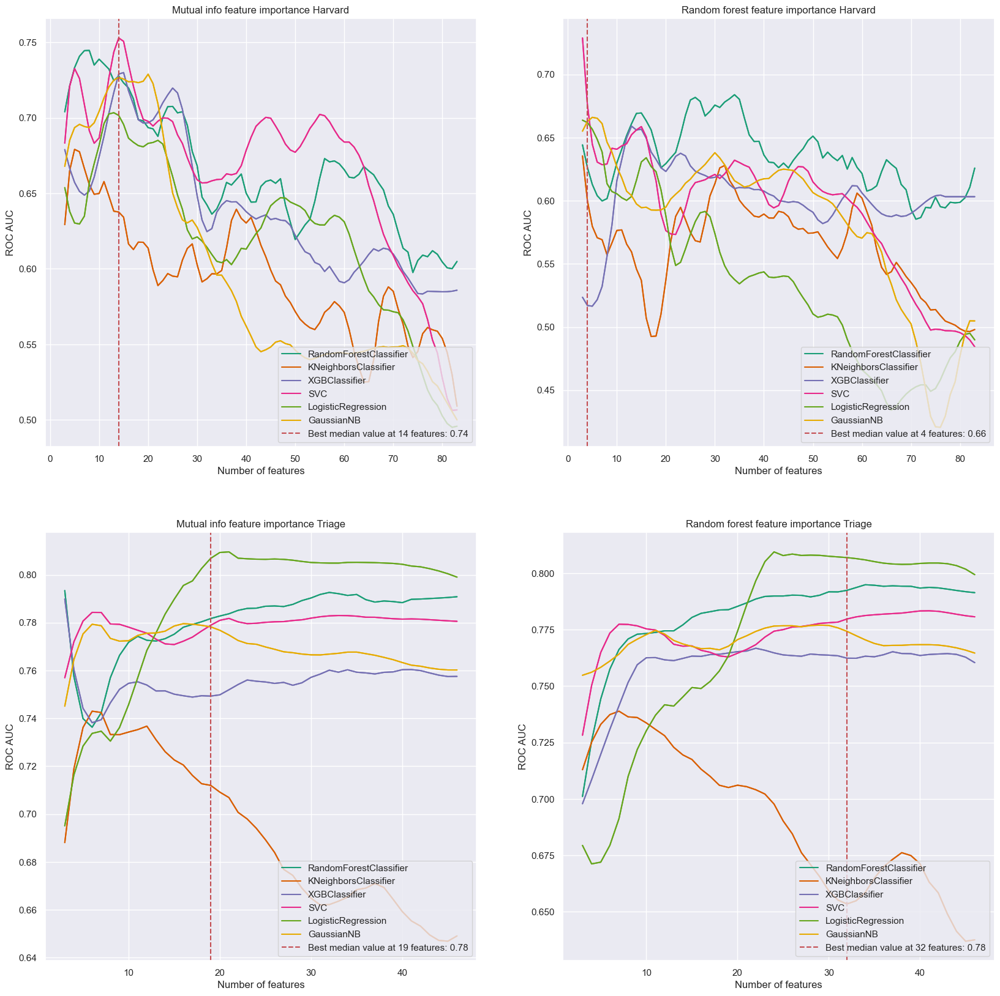

In [257]:
from scipy.signal import savgol_filter

colors = plt.get_cmap("Dark2")
# create a 2x2 plot
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
i = 0
for key, value in mutual_info_results_harvard.items():
    # smooth the curve
    axes[0, 0].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[0, 0].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in rf_results_harvard.items():
    axes[0, 1].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[0, 1].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in mutual_info_results_triage.items():
    axes[1, 0].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[1, 0].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in rf_results_triage.items():
    axes[1, 1].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[1, 1].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1


# calculate the median of all 3 classifiers
median_mi_harvard = np.median([value for key, value in mutual_info_results_harvard.items()], axis=0)
median_mi_triage = np.median([value for key, value in mutual_info_results_triage.items()], axis=0)

# the value with the highest median is the best
best_mi_harvard = np.argmax(median_mi_harvard) + 3
best_mi_value_harvard = np.round(np.max(median_mi_harvard), 2)
best_mi_triage = np.argmax(median_mi_triage) + 3
best_mi_value_triage = np.round(np.max(median_mi_triage), 2)
median_rf_harvard = np.median([value for key, value in rf_results_harvard.items()], axis=0)
median_rf_triage = np.median([value for key, value in rf_results_triage.items()], axis=0)
best_rf_harvard = np.argmax(median_rf_harvard) + 3 
best_rf_value_harvard = np.round(np.max(median_rf_harvard), 2)
best_rf_triage = np.argmax(median_rf_triage) + 3
best_rf_value_triage = np.round(np.max(median_rf_triage), 2)

# add a vertical line at the best value
axes[0,0].axvline(best_mi_harvard, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_mi_harvard, best_mi_value_harvard))
axes[1,0].axvline(best_mi_triage, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_mi_triage, best_mi_value_triage))
axes[0,1].axvline(best_rf_harvard, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_rf_harvard, best_rf_value_harvard))
axes[1,1].axvline(best_rf_triage, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_rf_triage, best_rf_value_triage))

axes[0,0].set_title('Mutual info feature importance Harvard')
axes[0,0].set_xlabel('Number of features')
axes[0,0].set_ylabel('ROC AUC')
axes[0,1].set_title('Random forest feature importance Harvard')
axes[0,1].set_xlabel('Number of features')
axes[0,1].set_ylabel('ROC AUC')
axes[1,0].set_title('Mutual info feature importance Triage')
axes[1,0].set_xlabel('Number of features')
axes[1,0].set_ylabel('ROC AUC')
axes[1,1].set_title('Random forest feature importance Triage')
axes[1,1].set_xlabel('Number of features')
axes[1,1].set_ylabel('ROC AUC')


# add legend for every axes
for ax in axes.flat:
    ax.legend(loc='lower right')

## Feature Space

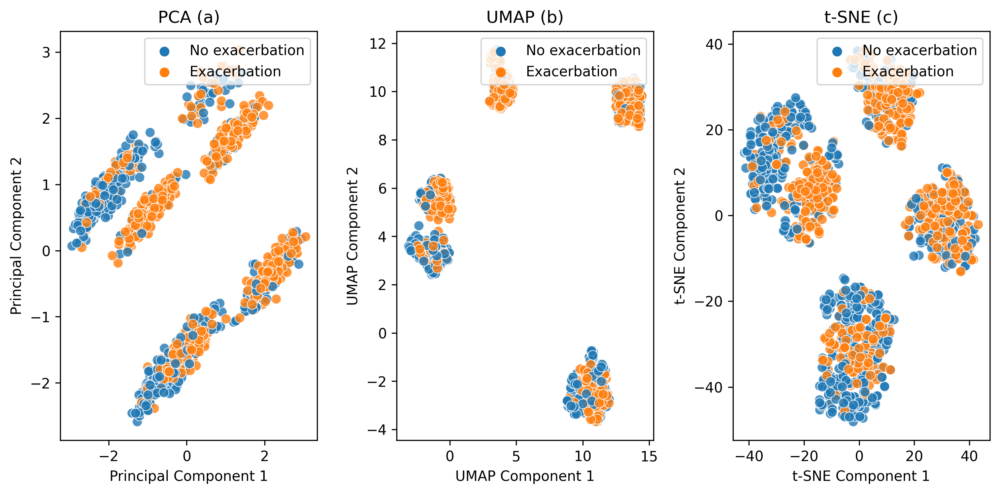

In [9]:
# create a PCA and UMAP plot for a selection of features
candidate_features = ['Cough details', 'Wheezing details', 'Sputum details', 'Ox Saturation b', 'Worse Symptoms', 'Dyspnea details', 'Increase in sputum', '% FEV1 b', 'Heartrate a', 'BMI', 'MMRC b', 'Heartrate b', 'Wheezing', 'Exacerbation']

selected_triage = triage[candidate_features].copy()
# fill using median
selected_triage = selected_triage.fillna(selected_triage.median())
X_triage = selected_triage.drop(columns=['Exacerbation'])
y_triage = selected_triage['Exacerbation']

# standardize
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
selected_triage = scaler.fit_transform(X_triage)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), dpi=300)
# create a PCA plot
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(selected_triage)
# scatter plot. Legend should say exacerbation and non-exacerbation
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=y_triage, ax=ax[0], legend='full', alpha=0.8, s=50 )
# change legend labels
handles, labels = ax[0].get_legend_handles_labels()
ax[0].legend(handles=handles, labels=['No exacerbation', 'Exacerbation'], loc='upper right')
ax[0].set_title('PCA (a)')
ax[0].set_xlabel('Principal Component 1')
ax[0].set_ylabel('Principal Component 2')
# add exacerbation and non-exacerbation as legend
# create a UMAP plot
import umap
reducer = umap.UMAP()
umap_result = reducer.fit_transform(selected_triage)
sns.scatterplot(x=umap_result[:, 0], y=umap_result[:, 1], hue=y_triage, ax=ax[1], legend='full', alpha=0.8, s=50)
# change legend labels
handles, labels = ax[1].get_legend_handles_labels()
ax[1].legend(handles=handles, labels=['No exacerbation', 'Exacerbation'], loc='upper right')
ax[1].set_title('UMAP (b)')
ax[1].set_xlabel('UMAP Component 1')
ax[1].set_ylabel('UMAP Component 2')

# create a t-SNE plot
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)
tsne_result = tsne.fit_transform(selected_triage)
sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=y_triage, ax=ax[2], legend='full', alpha=0.8, s=50)
# change legend labels
handles, labels = ax[2].get_legend_handles_labels()
ax[2].legend(handles=handles, labels=['No exacerbation', 'Exacerbation'], loc='upper right')
ax[2].set_title('t-SNE (c)')
ax[2].set_xlabel('t-SNE Component 1')
ax[2].set_ylabel('t-SNE Component 2')
plt.tight_layout()



## Descriptive Stats Traige

In [6]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from scipy.stats import norm
import statsmodels.api as sm

# binary columns are variables with only 2 values
binary_cols = triage.columns[triage.nunique() == 2].drop('Exacerbation')
count_dataframe = pd.DataFrame(columns=['Exacerbation', 'No Exacerbation', 'Odds Ratio'])
# add row n with the count of exacerbations
exa_count = triage['Exacerbation'][triage['Exacerbation'] == 1].count()
no_exa_count = triage['Exacerbation'][triage['Exacerbation'] == 0].count()
count_dataframe.loc['n'] = exa_count, no_exa_count, ""
for var in binary_cols:
    # the Exacerbation column is all values where fclinra08 is 1 and the value in col is the positive value
    exa_col_count = [triage['Exacerbation'][triage['Exacerbation'] == 1][triage[var] == 1].count()]
    exa_percentage = round(exa_col_count[0] / exa_count * 100, 2)
    exa_col_string = str(exa_col_count[0]) + ' (' + str(exa_percentage) + '%)'
    no_exa_col_count = [triage['Exacerbation'][triage['Exacerbation'] == 0][triage[var] == 1].count()]
    no_exa_percentage = round(no_exa_col_count[0] / no_exa_count * 100, 2)
    no_exa_col_string = str(no_exa_col_count[0]) + ' (' + str(no_exa_percentage) + '%)'
    # fit a logistic model to calculate the odds ratio
    X = triage[var]
    # drop all rows with nan values
    X = X[~np.isnan(X)]
    y = triage['Exacerbation']
    y = y[X.index]
    X = X.values.reshape(-1, 1)
    y = LabelEncoder().fit_transform(y)
    # calculate odds ratio for this variable using stats model
    sm_model = sm.Logit(y, sm.add_constant(X)).fit(disp=False)
    # get 95% CI for odds ratio
    ci = sm_model.conf_int(alpha=0.05, cols=None)
    # calculate odds ratio
    odds_ratio = np.exp(sm_model.params[1])
    # calculate lower and upper bound of 95% CI
    lower_bound = np.exp(ci[0][1])
    upper_bound = np.exp(ci[1][1])
    # create a string for the odds ratio and 95% CI
    odds_ratio_string = str(round(odds_ratio, 2)) + ' (' + str(round(lower_bound, 2)) + '-' + str(round(upper_bound, 2)) + ')'
    # add the counts to the dataframe
    count_dataframe.loc[var] = exa_col_string, no_exa_col_string, odds_ratio_string

# sort by effect size
count_dataframe.sort_values(by='Odds Ratio', ascending=False, inplace=True)

# now look at numeric variables
numeric_cols = triage.columns[triage.nunique() > 2]
mean_dataframe = pd.DataFrame(columns=['Exacerbation', 'No Exacerbation', 'Odds Ratio'])
for var in numeric_cols:
    positives = triage[var][triage['Exacerbation'] == 1]
    negatives = triage[var][triage['Exacerbation'] == 0]
    # get the mean + std for the exacerbation group with only 2 decimal places
    exacerbation_mean = round([positives.mean()][0], 2)
    exacerbation_std = round([positives.std()][0], 2)
    # create a string for the mean +- std
    exacerbation_string = str(exacerbation_mean) + u"(" + str(exacerbation_std) +")"
    # get the mean + std for the no exacerbation group
    no_exacerbation_mean = round([negatives.mean()][0], 2)
    no_exacerbation_std = round([negatives.std()][0], 2)
    # create a string for the mean +- std
    no_exacerbation_string = str(no_exacerbation_mean) + u"(" + str(no_exacerbation_std) +")"
    std_exa = triage[var][triage['Exacerbation'] == 1].std()
    # effect size 1 (Glass's delta) with Exacerbation group variance that we want to emphasize
    #effect_size = np.round((exacerbation_mean - no_exacerbation_mean) / std_exa, 2)
    X = triage[var]
    # drop all rows with nan values
    X = X[~np.isnan(X)]
    y = triage['Exacerbation']
    # match the indices of X and y
    y = y[X.index]
    X = X.values.reshape(-1, 1)
    y = LabelEncoder().fit_transform(y)
     # calculate odds ratio for this variable using stats model
    sm_model = sm.Logit(y, sm.add_constant(X)).fit(disp=False)
    ci = sm_model.conf_int(alpha=0.05, cols=None)
    # calculate odds ratio
    odds_ratio = np.exp(sm_model.params[1])
    # calculate lower and upper bound of 95% CI
    lower_bound = np.exp(ci[0][1])
    upper_bound = np.exp(ci[1][1])
    # create a string for the odds ratio and 95% CI
    odds_ratio_string = str(round(odds_ratio, 2)) + ' (' + str(round(lower_bound, 2)) + '-' + str(round(upper_bound, 2)) + ')'

    # add the strings to the dataframe
    mean_dataframe.loc[var] = exacerbation_string, no_exacerbation_string, odds_ratio_string

# sort by effect size
mean_dataframe.sort_values(by='Odds Ratio', ascending=False, inplace=True)

# concat both dataframes
descriptive_stats = pd.concat([count_dataframe, mean_dataframe], axis=0)


# export to csv
descriptive_stats.to_csv('./triage_descriptive_stats_2.csv', sep=';', decimal=',', encoding='utf-8')